# <font color='green'>Projet 4 : Segmentez des clients d'un site e-commerce</font>

# Partie 1 : Nettoyage et exploration

In [2]:
# importation des librairies

import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import missingno as msno
import statsmodels.api as sm
import plotly
import plotly.express as px
from datetime import timedelta
from scipy import stats

## Sommaire

1. Objectifs
2. Données
 - Source des données
 - Description
3. Nettoyage
4. Analyse exploratoire
5. Feature engineering
6. Exportation des données pour la modèlisation

## 1. Objectifs

Vous êtes consultant pour Olist, une entreprise brésilienne qui propose une solution de vente sur les marketplaces en ligne.

Olist souhaite que vous fournissiez à ses équipes d'e-commerce une segmentation des clients qu’elles pourront utiliser au quotidien pour leurs campagnes de communication.

Votre objectif est de comprendre les différents types d’utilisateurs grâce à leur comportement et à leurs données personnelles.

Vous devrez fournir à l’équipe marketing une description actionable de votre segmentation et de sa logique sous-jacente pour une utilisation optimale, ainsi qu’une proposition de contrat de maintenance basée sur une analyse de la stabilité des segments au cours du temps.

## 2. Données

Pour cette mission, Olist vous fournit une base de données anonymisée comportant des informations sur l’historique de commandes, les produits achetés, les commentaires de satisfaction, et la localisation des clients depuis janvier 2017.
Notes :
- Une commande peut avoir plusieurs articles.
- Chaque article peut être traité par un vendeur distinct.
- Tous les textes identifiant les magasins et les partenaires ont été remplacés par les noms des grandes maisons de Game of Thrones.

### Source des données :

https://www.kaggle.com/datasets/olistbr/brazilian-ecommerce

Les données sont divisées en plusieurs dataset selon le schéma suivant :

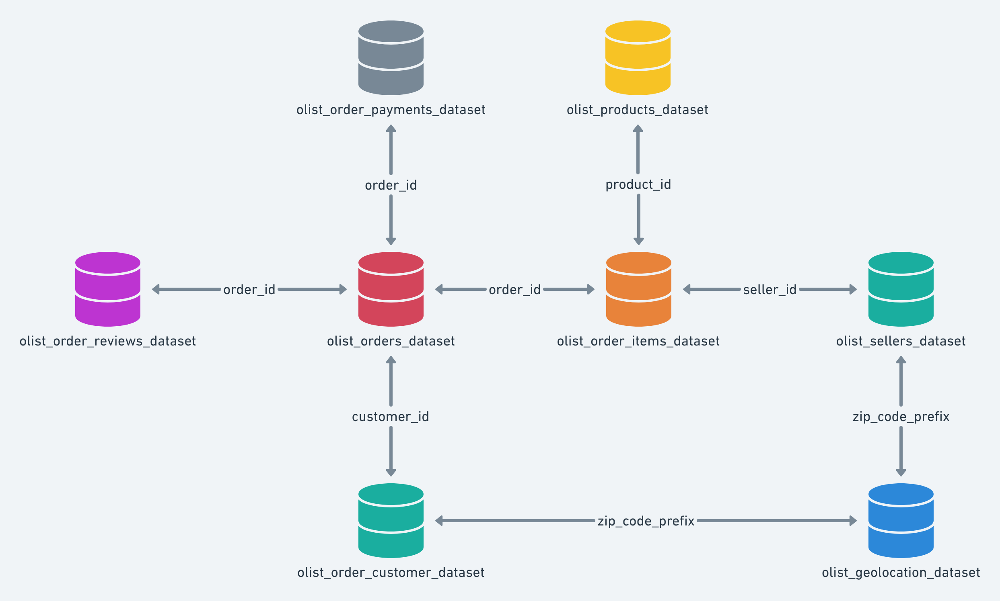

### Chargement des données :

In [3]:
# chargement des fichiers

df_customers = pd.read_csv('C:\\Users\\mfila\\olist_customers_dataset.csv')
df_geolocation = pd.read_csv('C:\\Users\\mfila\\olist_geolocation_dataset.csv')
df_order_items = pd.read_csv('C:\\Users\\mfila\\olist_order_items_dataset.csv')
df_order_payments = pd.read_csv('C:\\Users\\mfila\\olist_order_payments_dataset.csv')
df_order_reviews = pd.read_csv('C:\\Users\\mfila\\olist_order_reviews_dataset.csv')
df_orders = pd.read_csv('C:\\Users\\mfila\\olist_orders_dataset.csv')
df_products = pd.read_csv('C:\\Users\\mfila\\olist_products_dataset.csv')
df_sellers = pd.read_csv('C:\\Users\\mfila\\olist_sellers_dataset.csv')
df_translation = pd.read_csv('C:\\Users\\mfila\\product_category_name_translation.csv')

### Contenu

#### Dataset clients : df_customers

In [4]:
# 2 premières lignes

df_customers.head(2)

,customer_id,customer_unique_id,customer_zip_code_prefix,customer_city,customer_state
0,06b8999e2fba1a1fbc88172c00ba8bc7,861eff4711a542e4b93843c6dd7febb0,14409,franca,SP
1,18955e83d337fd6b2def6b18a428ac77,290c77bc529b7ac935b93aa66c333dc3,9790,sao bernardo do campo,SP


In [5]:
# vérification du remplissage, des variables, des types de colonnes

df_customers.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 99441 entries, 0 to 99440
Data columns (total 5 columns):
 #   Column                    Non-Null Count  Dtype 
---  ------                    --------------  ----- 
 0   customer_id               99441 non-null  object
 1   customer_unique_id        99441 non-null  object
 2   customer_zip_code_prefix  99441 non-null  int64 
 3   customer_city             99441 non-null  object
 4   customer_state            99441 non-null  object
dtypes: int64(1), object(4)
memory usage: 3.8+ MB


Ce jeu de données regroupe des informations sur les clients et leur emplacement ; il ne contient pas de valeurs absentes.

Deux variables sont utilisées pour identifier les clients : 
- customer_id est un code du client qui est généré pour chaque commande. Le même client aura donc des identifiants différents pour des commandes différentes. 
- customer_unique_id est unique à chaque client et peut être utilisé pour suivre leurs achats dans le temps.

Trois variables sont utilisées pour identifier l'emplacement du client : 
- code postal
- ville de résidence
- Etat de résidence 

In [6]:
# nombre de valeurs uniques pour chaque variable

df_customers.nunique()

customer_id                 99441
customer_unique_id          96096
customer_zip_code_prefix    14994
customer_city                4119
customer_state                 27
dtype: int64

In [7]:
# Nombre de 'customer_id' pour chaque 'customer_unique_id' 

df_id = pd.DataFrame(df_customers.groupby('customer_unique_id')
                              [['customer_id']].count()['customer_id']
                              .sort_values(ascending=False))

# Clients uniques avec plus que 1 'customer_id' (nombre de commandes) 

df_id[df_id['customer_id'] > 1]

,customer_id
customer_unique_id,
8d50f5eadf50201ccdcedfb9e2ac8455,17
3e43e6105506432c953e165fb2acf44c,9
6469f99c1f9dfae7733b25662e7f1782,7
ca77025e7201e3b30c44b472ff346268,7
1b6c7548a2a1f9037c1fd3ddfed95f33,7
...,...
5cfc9643603c095fd7ed86a50fa17887,2
cfb025f193db116549c9c23e4d58e3e3,2
609b7feab0f0c9726929ec4891447b02,2


Le dataset contient 96096 clients uniques, 2997 clients ont commandé 2 fois ou plus (moins de 3% de clients).

<AxesSubplot:xlabel='customer_state', ylabel='count'>

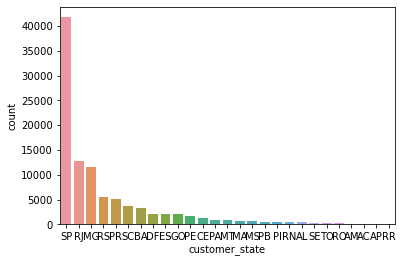

In [8]:
# Réprésentation des Etats avec plus de clients

sns.countplot(x='customer_state',
                   data=df_customers,order = df_customers['customer_state'].value_counts().index)


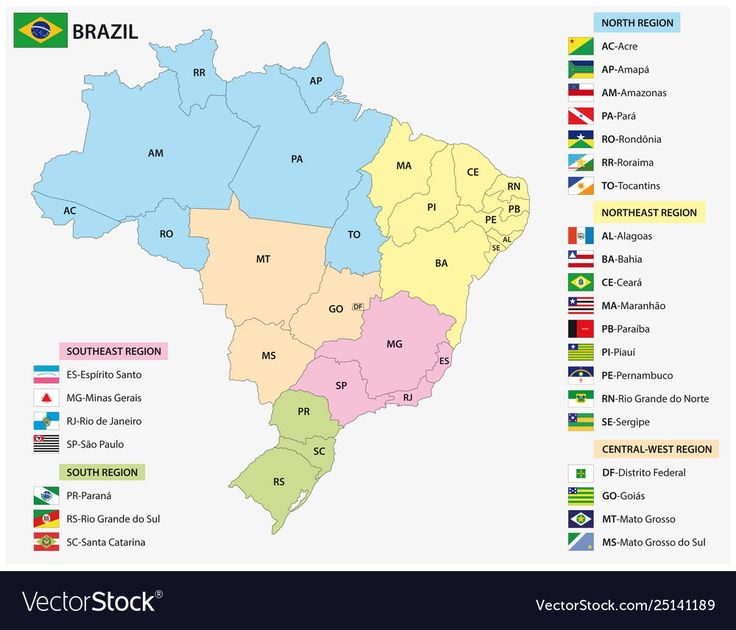

La plupart des clients sont localisés dans les 3 états :
- SP : São Paulo,
- RJ : Rio de Janeiro,
- MG : Minas Gerais.

#### Geolocalisation : df_geolocation

In [9]:
# 2 premières lignes

df_geolocation.head(2)

,geolocation_zip_code_prefix,geolocation_lat,geolocation_lng,geolocation_city,geolocation_state
0,1037,-23.545621,-46.639292,sao paulo,SP
1,1046,-23.546081,-46.644820,sao paulo,SP


In [10]:
# vérification du remplissage, des variables, des types de colonnes

df_geolocation.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000163 entries, 0 to 1000162
Data columns (total 5 columns):
 #   Column                       Non-Null Count    Dtype  
---  ------                       --------------    -----  
 0   geolocation_zip_code_prefix  1000163 non-null  int64  
 1   geolocation_lat              1000163 non-null  float64
 2   geolocation_lng              1000163 non-null  float64
 3   geolocation_city             1000163 non-null  object 
 4   geolocation_state            1000163 non-null  object 
dtypes: float64(2), int64(1), object(2)
memory usage: 38.2+ MB


Ce jeu de données regroupe des informations sur les codes postaux brésiliens et leurs coordonnées géographiques (latitude, longitude); il ne contient pas de valeurs absentes. Les colonnes ville et Etat sont redondantes par rapport au dataframe customer_id.

In [11]:
# nombre de valeurs uniques pour chaque variable

df_geolocation.nunique()

geolocation_zip_code_prefix     19015
geolocation_lat                717360
geolocation_lng                717613
geolocation_city                 8011
geolocation_state                  27
dtype: int64

Il existe plusieurs latitudes et longitudes différentes pour un code postal donné. Pour chaque unique code postal nous allons attribuer les moyennes latitudes et longitudes.

In [12]:
# Attribuer des latitudes/longitudes moyennes à chaque code postal unique dans un nouveau dataframe df_geoloc

df_geolocation1 = df_geolocation.groupby('geolocation_zip_code_prefix') \
    .agg({'geolocation_lat': 'mean', 'geolocation_lng': 'mean'}) \
    .reset_index()

# Vérification
df_geolocation1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 19015 entries, 0 to 19014
Data columns (total 3 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   geolocation_zip_code_prefix  19015 non-null  int64  
 1   geolocation_lat              19015 non-null  float64
 2   geolocation_lng              19015 non-null  float64
dtypes: float64(2), int64(1)
memory usage: 445.8 KB


In [13]:
df_geolocation1

,geolocation_zip_code_prefix,geolocation_lat,geolocation_lng
0,1001,-23.550190,-46.634024
1,1002,-23.548146,-46.634979
2,1003,-23.548994,-46.635731
3,1004,-23.549799,-46.634757
4,1005,-23.549456,-46.636733
...,...,...,...
19010,99960,-27.953722,-52.025511
19011,99965,-28.183372,-52.039850
19012,99970,-28.343766,-51.874689
19013,99980,-28.389129,-51.843836


Le dataset df_geoloc peut être fussionné avec le dataframe df_customers par zip_code_prefix.

#### Commandes : df_orders

In [14]:
# 2 premières lignes

df_orders.head(2)

,order_id,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date
0,e481f51cbdc54678b7cc49136f2d6af7,9ef432eb6251297304e76186b10a928d,delivered,2017-10-02 10:56:33,2017-10-02 11:07:15,2017-10-04 19:55:00,2017-10-10 21:25:13,2017-10-18 00:00:00
1,53cdb2fc8bc7dce0b6741e2150273451,b0830fb4747a6c6d20dea0b8c802d7ef,delivered,2018-07-24 20:41:37,2018-07-26 03:24:27,2018-07-26 14:31:00,2018-08-07 15:27:45,2018-08-13 00:00:00


In [15]:
# vérification du remplissage, des variables, des types de colonnes

df_orders.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 99441 entries, 0 to 99440
Data columns (total 8 columns):
 #   Column                         Non-Null Count  Dtype 
---  ------                         --------------  ----- 
 0   order_id                       99441 non-null  object
 1   customer_id                    99441 non-null  object
 2   order_status                   99441 non-null  object
 3   order_purchase_timestamp       99441 non-null  object
 4   order_approved_at              99281 non-null  object
 5   order_delivered_carrier_date   97658 non-null  object
 6   order_delivered_customer_date  96476 non-null  object
 7   order_estimated_delivery_date  99441 non-null  object
dtypes: object(8)
memory usage: 6.1+ MB


Ce jeu de données regroupe des informations sur les commandes ; chaque ligne représente une commande.
Customer_id est la clé pour se connecter au jeu de données clients,
order_id est la clé pour se connecter à tous les autres jeux de données liés aux commandes.

Présence des valeurs absentes.

5 colonnes représentent les dates, type de colonne à corriger.

In [16]:
# Transformer les variables représentant des dates en Datetime

cols = ['order_purchase_timestamp', 'order_approved_at',
        'order_delivered_carrier_date', 'order_delivered_customer_date',
        'order_estimated_delivery_date']
for col in cols:
    df_orders[col] = pd.to_datetime(df_orders[col],
                                    format='%Y-%m-%d %H:%M:%S')

In [17]:
# nombre de valeurs uniques pour chaque variable

df_orders.order_status.value_counts()

delivered      96478
shipped         1107
canceled         625
unavailable      609
invoiced         314
processing       301
created            5
approved           2
Name: order_status, dtype: int64

Text(0.5, 0, 'Status')

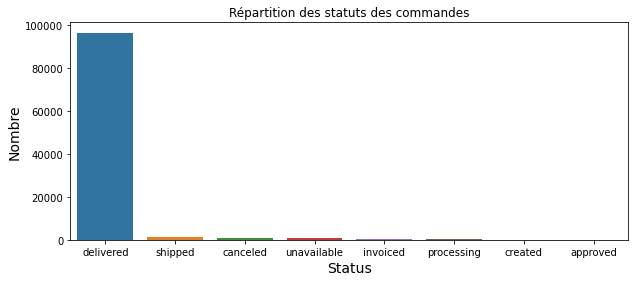

In [18]:
# nombre de commandes par status

plt.figure(figsize=(10, 4))
sns.countplot(x='order_status',
                   data=df_orders,order = df_orders['order_status'].value_counts().index)
plt.title('Répartition des statuts des commandes', fontsize=12)
plt.ylabel('Nombre'.title(), fontsize=14)
plt.xlabel('Status'.title(), fontsize=14)

In [19]:
# Nous allons conserver les commandes livrées uniquement

drop_index = df_orders[df_orders['order_status'] != 'delivered'].index
df_orders1 = df_orders.copy()
df_orders1.drop(drop_index, axis=0, inplace=True)

In [20]:
# vérification des Nan

df_orders1.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 96478 entries, 0 to 99440
Data columns (total 8 columns):
 #   Column                         Non-Null Count  Dtype         
---  ------                         --------------  -----         
 0   order_id                       96478 non-null  object        
 1   customer_id                    96478 non-null  object        
 2   order_status                   96478 non-null  object        
 3   order_purchase_timestamp       96478 non-null  datetime64[ns]
 4   order_approved_at              96464 non-null  datetime64[ns]
 5   order_delivered_carrier_date   96476 non-null  datetime64[ns]
 6   order_delivered_customer_date  96470 non-null  datetime64[ns]
 7   order_estimated_delivery_date  96478 non-null  datetime64[ns]
dtypes: datetime64[ns](5), object(3)
memory usage: 6.6+ MB


In [21]:
# Supprimer les Nan

df_orders1.dropna(axis=0, inplace=True)

In [22]:
# Périodes d'achat

min = df_orders1['order_purchase_timestamp'].min().strftime('%d/%m/%Y')
max = df_orders1['order_purchase_timestamp'].max().strftime('%d/%m/%Y')
print(f'Période d\'achat : du {min} au {max}')

Période d'achat : du 15/09/2016 au 29/08/2018


In [23]:
# nombre de commandes dans le temps

fig = px.histogram(df_orders1['order_purchase_timestamp'],
                   labels={'x': 'order_purchase_timestamp'})

fig.update_layout(
                  xaxis=dict(title='Date de commande',
                             linecolor='#CCC',
                             showgrid=True),
                  yaxis=dict(title='Nombre',
                             linecolor="#CCC",
                             showgrid=True),
                  plot_bgcolor='#FFF',
                  width=800)

fig.update_traces(marker_color='SteelBlue')
fig.show()

In [24]:
# Garder les variables importantes

df_orders1 = df_orders1.loc[:, ['order_id',
                        'customer_id',
                        'order_purchase_timestamp',
                        'order_delivered_customer_date','order_estimated_delivery_date']]
df_orders1.sample(5)

,order_id,customer_id,order_purchase_timestamp,order_delivered_customer_date,order_estimated_delivery_date
27342,84660812690bb3e1d202c040dfaf5cee,d3bfcd6b8429123c838019a536a1a7e5,2018-04-14 12:34:01,2018-04-19 01:19:03,2018-05-03
4457,995cb1fde464cb3683cf2902d8827a13,985b35e7309802e954547d2f6fdfe9e9,2018-07-15 21:00:44,2018-07-25 21:41:16,2018-08-02
1879,b0f093c9a7e135bb44a1e1bd7406ba30,f57351f8f87213bbb758f2f902f600c2,2018-05-18 12:22:08,2018-06-06 20:41:34,2018-06-07
25992,c0e97734cd5f14ad83087abe8d29073b,46fa17a2a17cd859ec50529ea1884a13,2018-01-29 20:11:03,2018-02-07 19:52:30,2018-02-22
10731,6b3283bced42ff1c70f94eb1736fdabc,cca89c1caa9494d6a314e6ac71d1b159,2018-06-06 17:17:31,2018-06-18 18:11:51,2018-07-20


In [25]:
# Délai de livraison, entre la date de livraison réelle et la commande (en jours)

df_orders1['delivery_days'] = (
    df_orders1['order_delivered_customer_date'] -
    df_orders1['order_purchase_timestamp']).dt.days

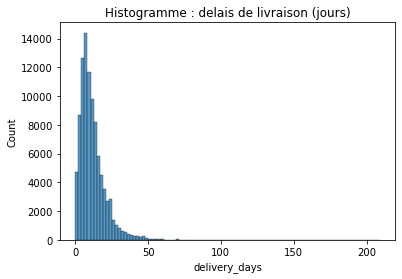

In [26]:
sns.histplot(data=df_orders1, x=df_orders1['delivery_days'],bins=100)
plt.title("Histogramme : delais de livraison (jours)")
plt.show()

In [27]:
# Retard de livraison (entre la livraison réelle et la date de livraison prévue   (en jours)

df_orders1['delivery_late'] = (
    df_orders1['order_delivered_customer_date'] -
    df_orders1['order_estimated_delivery_date']).dt.days

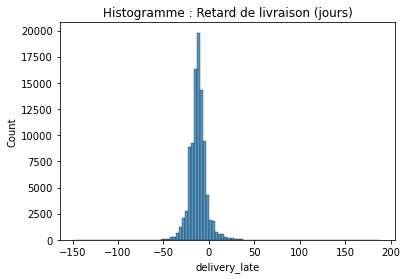

In [28]:
sns.histplot(data=df_orders1, x=df_orders1['delivery_late'],bins=100)
plt.title("Histogramme : Retard de livraison (jours)")
plt.show()

Les valeurs négatives représentent les commandes livrées avant la date prevue de livraison.

In [29]:
df_orders1['delivery_late'] = [1 if s > 0 else 0 for s in df_orders1['delivery_late']] 

Text(0.5, 0, 'Status')

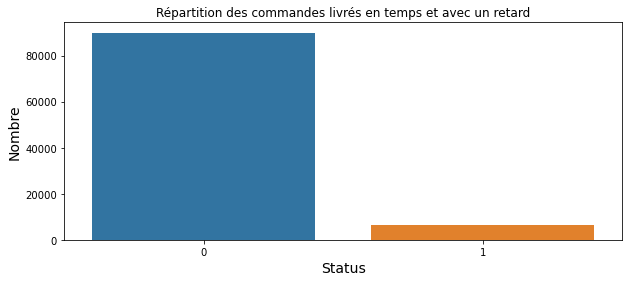

In [30]:
# nombre de commandes par livré en temps et avec un retard

plt.figure(figsize=(10, 4))
sns.countplot(x='delivery_late',
                   data=df_orders1,order = df_orders1['delivery_late'].value_counts().index)
plt.title('Répartition des commandes livrés en temps et avec un retard', fontsize=12)
plt.ylabel('Nombre'.title(), fontsize=14)
plt.xlabel('Status'.title(), fontsize=14)

Le dataset est complet, les jointures sont possibles avec avec le jeu de données des clients et aux autres jeux de données liés aux commandes.

#### Commandes : df_order_items

In [31]:
# 2 premières lignes

df_order_items.head(2)

,order_id,order_item_id,product_id,seller_id,shipping_limit_date,price,freight_value
0,00010242fe8c5a6d1ba2dd792cb16214,1,4244733e06e7ecb4970a6e2683c13e61,48436dade18ac8b2bce089ec2a041202,2017-09-19 09:45:35,58.9,13.29
1,00018f77f2f0320c557190d7a144bdd3,1,e5f2d52b802189ee658865ca93d83a8f,dd7ddc04e1b6c2c614352b383efe2d36,2017-05-03 11:05:13,239.9,19.93


In [32]:
# vérification du remplissage, des variables, des types de colonnes

df_order_items.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 112650 entries, 0 to 112649
Data columns (total 7 columns):
 #   Column               Non-Null Count   Dtype  
---  ------               --------------   -----  
 0   order_id             112650 non-null  object 
 1   order_item_id        112650 non-null  int64  
 2   product_id           112650 non-null  object 
 3   seller_id            112650 non-null  object 
 4   shipping_limit_date  112650 non-null  object 
 5   price                112650 non-null  float64
 6   freight_value        112650 non-null  float64
dtypes: float64(2), int64(1), object(4)
memory usage: 6.0+ MB


In [33]:
# recherche des doublons par order_id

df_order_items.order_id.value_counts()

8272b63d03f5f79c56e9e4120aec44ef    21
ab14fdcfbe524636d65ee38360e22ce8    20
1b15974a0141d54e36626dca3fdc731a    20
428a2f660dc84138d969ccd69a0ab6d5    15
9ef13efd6949e4573a18964dd1bbe7f5    15
                                    ..
906368486fd64a44a16e7190972e3f3d     1
520b343a3cfee76d9517d96e84b03277     1
4c2da572497ba6e438bf4431c448092a     1
b213718ea651bba092dfdf03b7e07af1     1
49786a9c2b41f65bfb53a1c346f08f32     1
Name: order_id, Length: 98666, dtype: int64

In [34]:
# recherche des articles commandés plusieurs fois

df_order_items.order_item_id.value_counts()

1     98666
2      9803
3      2287
4       965
5       460
6       256
7        58
8        36
9        28
10       25
11       17
12       13
13        8
14        7
15        5
16        3
17        3
18        3
19        3
20        3
21        1
Name: order_item_id, dtype: int64

In [35]:
# Doublons par order_id

duplicate = df_order_items[df_order_items.order_id.duplicated()]
duplicate

,order_id,order_item_id,product_id,seller_id,shipping_limit_date,price,freight_value
14,0008288aa423d2a3f00fcb17cd7d8719,2,368c6c730842d78016ad823897a372db,1f50f920176fa81dab994f9023523100,2018-02-21 02:55:52,49.90,13.37
33,00143d0f86d6fbd9f9b38ab440ac16f5,2,e95ee6822b66ac6058e2e4aff656071a,a17f621c590ea0fab3d5d883e1630ec6,2017-10-20 16:07:52,21.33,15.10
34,00143d0f86d6fbd9f9b38ab440ac16f5,3,e95ee6822b66ac6058e2e4aff656071a,a17f621c590ea0fab3d5d883e1630ec6,2017-10-20 16:07:52,21.33,15.10
43,001ab0a7578dd66cd4b0a71f5b6e1e41,2,0b0172eb0fd18479d29c3bc122c058c2,5656537e588803a555b8eb41f07a944b,2018-01-04 02:33:42,24.89,17.63
44,001ab0a7578dd66cd4b0a71f5b6e1e41,3,0b0172eb0fd18479d29c3bc122c058c2,5656537e588803a555b8eb41f07a944b,2018-01-04 02:33:42,24.89,17.63
...,...,...,...,...,...,...,...
112617,ffecd5a79a0084f6a592288c67e3c298,3,50fd2b788dc166edd20512370dac54df,8b321bb669392f5163d04c59e235e066,2018-03-05 20:15:27,21.90,15.79
112635,fff8287bbae429a99bb7e8c21d151c41,2,bee2e070c39f3dd2f6883a17a5f0da45,4e922959ae960d389249c378d1c939f5,2018-03-27 12:29:22,180.00,48.14
112641,fffb9224b6fc7c43ebb0904318b10b5f,2,43423cdffde7fda63d0414ed38c11a73,b1fc4f64df5a0e8b6913ab38803c57a9,2017-11-03 02:55:58,55.00,34.19
112642,fffb9224b6fc7c43ebb0904318b10b5f,3,43423cdffde7fda63d0414ed38c11a73,b1fc4f64df5a0e8b6913ab38803c57a9,2017-11-03 02:55:58,55.00,34.19


Ce jeu de données regroupe des informations sur les articles ; il ne contient pas de valeurs absentes.

- Order_id : Plusieurs lignes avec cet identifiant si le même article est commandé plusieurs fois.
La plupart des articles ont été commandés en un seul exemplaire.
- Order_item_id : numéro identifiant le nombre d'articles inclus dans le même ordre
- Product_id : identifiant unique du produit
- Seller_id : identifiant unique du vendeur	
- Shipping_limit_date : date limite d'expédition du vendeur pour le transfert de la commande au partenaire logistique
- Price : prix d'un article
- Freight_value : frais de livraison (total pour la commande)

Modification peuvent être faites pour avoir un jeu de données contenant pour une ligne un ordre. 
La jointure peut être faite avec :

order_id avec le jeu de données des commandes (df_items.order_id et df_orders.order_id),
product_id avec le jeu de données des produits (df_items.product_id et df_products.product_id)
et seller_id avec le jeu de données des vendeurs (df_items.seller_id et df_sellers.seller_id).

In [36]:
# Transformer les variables représentant des dates en Datetime

df_order_items['shipping_limit_date'] = pd.to_datetime(df_order_items['shipping_limit_date'],
                                    format='%Y-%m-%d %H:%M:%S')

In [37]:
# Dates d'expedition

min = df_order_items['shipping_limit_date'].min().strftime('%d/%m/%Y')
max = df_order_items['shipping_limit_date'].max().strftime('%d/%m/%Y')
print(f"Dates limites d'expedition : du {min} au {max}")

Dates limites d'expedition : du 19/09/2016 au 09/04/2020


In [38]:
df_order_items.describe()

,order_item_id,price,freight_value
count,112650.000000,112650.000000,112650.000000
mean,1.197834,120.653739,19.990320
std,0.705124,183.633928,15.806405
min,1.000000,0.850000,0.000000
25%,1.000000,39.900000,13.080000
50%,1.000000,74.990000,16.260000
75%,1.000000,134.900000,21.150000
max,21.000000,6735.000000,409.680000


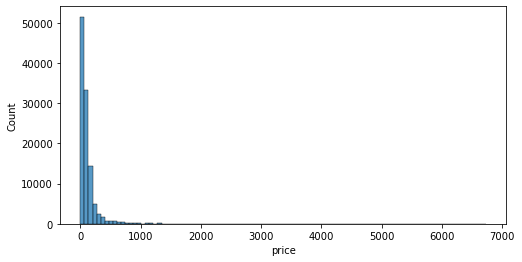

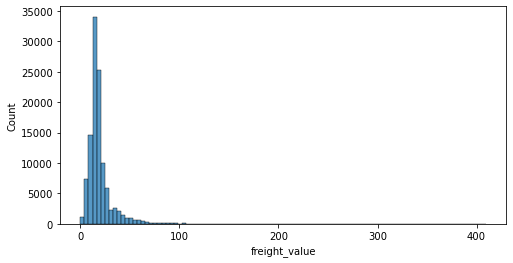

In [39]:
var_num = ['price','freight_value']

for var in var_num:
    # Histogramme de distribution des prix et des frais de livraison
   
    fig = plt.figure(figsize=(8,4))
    ax = fig.add_subplot(111)
    ax = sns.histplot(data=df_order_items, x=df_order_items[var],bins=100)
    plt.show()

In [40]:
# Creation du dataframe avec une ligne par commande

df_order_items1 = df_order_items.groupby('order_id')\
    .agg(price_sum=('price', 'sum'),
         freight_value_sum=('freight_value', 'max'),
         shipping_limit_date=('shipping_limit_date', 'max'),
         nbr_items=('order_item_id', 'max')).reset_index()

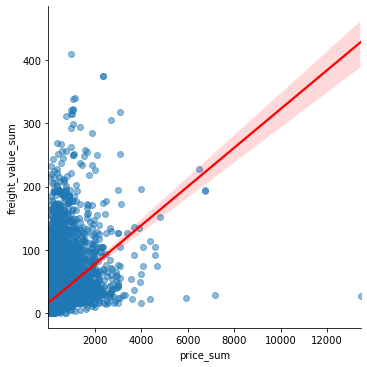

In [41]:
# Prix total et frais de livraison pour detecter des outliers

sns.lmplot(data=df_order_items1,x="price_sum", y="freight_value_sum", line_kws = {'color': 'red'},scatter_kws={'alpha':0.5})
plt.show()

In [42]:
df_order_items1.sample(10)

,order_id,price_sum,freight_value_sum,shipping_limit_date,nbr_items
33711,578c61a097978687b2c5109f39efe918,64.99,14.62,2017-03-21 14:56:00,1
41042,6a98404a0f7370f4922f570f83cd508f,29.00,11.85,2017-07-31 03:30:42,1
79746,cee3d35c01c3ae1ed31809bdb2272afb,319.96,24.87,2017-08-07 02:25:30,4
45599,767b76997bafc4391a3018711fd833a9,179.99,45.72,2017-11-30 12:51:50,1
27039,462f5581ea52a4b865cc8e66f70661a1,38.90,12.48,2017-10-15 22:14:51,1
39862,67796eabcf10419c4abd84d49a3ecd59,97.90,17.43,2017-03-07 13:25:11,1
41511,6bd0ccbdad2eab45930f72fbd6d128ef,199.00,32.14,2018-02-22 14:15:38,1
66989,ae51637de4a4424c759ab8b2c4279310,36.99,14.57,2018-07-23 00:05:32,1
33249,56472b840118d1bfb244c6cb42581ae6,299.90,19.98,2018-04-26 13:31:40,1
47880,7c666dfeba44ed20c9ad3f4b3d7c5e8c,139.90,14.00,2017-12-07 18:30:36,1


#### Commandes : df_order_payments

In [43]:
# 2 premières lignes

df_order_payments.head(2)

,order_id,payment_sequential,payment_type,payment_installments,payment_value
0,b81ef226f3fe1789b1e8b2acac839d17,1,credit_card,8,99.33
1,a9810da82917af2d9aefd1278f1dcfa0,1,credit_card,1,24.39


In [44]:
# vérification du remplissage, des variables, des types de colonnes

df_order_payments.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 103886 entries, 0 to 103885
Data columns (total 5 columns):
 #   Column                Non-Null Count   Dtype  
---  ------                --------------   -----  
 0   order_id              103886 non-null  object 
 1   payment_sequential    103886 non-null  int64  
 2   payment_type          103886 non-null  object 
 3   payment_installments  103886 non-null  int64  
 4   payment_value         103886 non-null  float64
dtypes: float64(1), int64(2), object(2)
memory usage: 4.0+ MB


Pas de valeurs manquantes.

In [45]:
# recherche des doublons par order_id

df_order_payments.order_id.value_counts()

fa65dad1b0e818e3ccc5cb0e39231352    29
ccf804e764ed5650cd8759557269dc13    26
285c2e15bebd4ac83635ccc563dc71f4    22
895ab968e7bb0d5659d16cd74cd1650c    21
fedcd9f7ccdc8cba3a18defedd1a5547    19
                                    ..
7cb72e0bbd081c1483fb0b200266b7d3     1
1f133ab6b29096670c6f0024ffa95d3f     1
970390fb495e959776145e1bfe58de8a     1
39847297a2eb4f18d407cb1fa8a06867     1
49786a9c2b41f65bfb53a1c346f08f32     1
Name: order_id, Length: 99440, dtype: int64

In [46]:
# Doublons par order_id

duplicate = df_order_payments[df_order_payments.order_id.duplicated()]
duplicate

,order_id,payment_sequential,payment_type,payment_installments,payment_value
1456,683bf306149bb869980b68d48a1bd6ab,1,credit_card,1,8.58
2324,e6a66a8350bb88497954d37688ab123e,2,voucher,1,10.51
2393,8e5148bee82a7e42c5f9ba76161dc51a,1,credit_card,1,0.67
2414,816ccd9d21435796e8ffa9802b2a782f,1,credit_card,1,5.65
2497,2cbcb371aee438c59b722a21d83597e0,2,voucher,1,7.80
...,...,...,...,...,...
103778,fd86c80924b4be8fb7f58c4ecc680dae,1,credit_card,1,76.10
103817,6d4616de4341417e17978fe57aec1c46,1,credit_card,1,19.18
103860,31bc09fdbd701a7a4f9b55b5955b8687,6,voucher,1,77.99
103869,c9b01bef18eb84888f0fd071b8413b38,1,credit_card,6,238.16


In [47]:
# zoom sur les lignes avec le même order_id

df_order_payments.loc[df_order_payments.order_id=='c9b01bef18eb84888f0fd071b8413b38',:]

,order_id,payment_sequential,payment_type,payment_installments,payment_value
10326,c9b01bef18eb84888f0fd071b8413b38,2,voucher,1,128.44
103869,c9b01bef18eb84888f0fd071b8413b38,1,credit_card,6,238.16


Un client peut payer avec plusieurs moyens de paiement (Payment_sequential) donc avoir plusieurs lignes avec le même identifiant order_id.
Un client peut payer en plusieurs fois (Payment_installments).
La jointure peut se faire avec order_id du jeu de données des commandes (df_payments.order_id et df_orders.order_id).

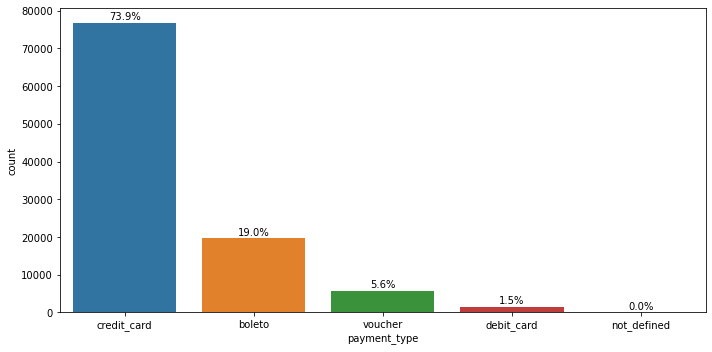

In [48]:
# Pourcentage des commandes par type de payement

plt.figure(figsize=(10, 5))
ax = sns.countplot(x='payment_type',
                   data=df_order_payments)
total = len(df_order_payments)
for p in ax.patches:
    percentage = f'{100 * p.get_height() / total:.1f}%\n'
    x = p.get_x() + p.get_width() / 2
    y = p.get_height()
    ax.annotate(percentage, (x, y), ha='center', va='center')
plt.tight_layout()
plt.show()

La majorité des paiement se font :
par carte bancaire à débit différé (74%),
puis en billet (19%),
puis en crypto Voucher (5%, carte pépayée),
par carte à débit immédiat(1.5%)

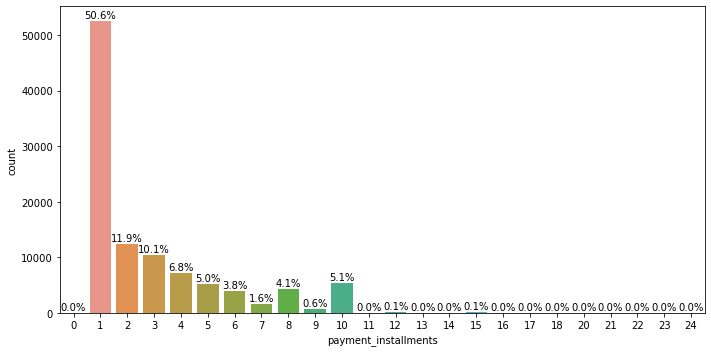

In [49]:
# Visualisation payements en plusieurs fois

plt.figure(figsize=(10, 5))
ax = sns.countplot(x='payment_installments',
                   data=df_order_payments)
total = len(df_order_payments)
for p in ax.patches:
    percentage = f'{100 * p.get_height() / total:.1f}%\n'
    x = p.get_x() + p.get_width() / 2
    y = p.get_height()
    ax.annotate(percentage, (x, y), ha='center', va='center')
plt.tight_layout()
plt.show()

La moitié des clients paient en 1 seule fois, les autres effectuent les paiements s'échelonnant de 2 à 10 fois.

#### Commandes : df_order_reviews

In [50]:
# 2 premières lignes

df_order_reviews.sample(10)

,review_id,order_id,review_score,review_comment_title,review_comment_message,review_creation_date,review_answer_timestamp
31487,5f926c80a7c55523ff2406cd383b5337,575ca88a26f8e32bb7691d172640bbb6,5,NaN,"Gostei, era realmente oq esperava, chegou bem ...",2018-02-09 00:00:00,2018-02-10 01:59:15
53683,a5888ee8e0651ee49bd289f0cc16910d,5ec560222cf73999224c88e44327937c,4,NaN,NaN,2017-12-12 00:00:00,2017-12-14 10:46:30
89852,d6c01fd00d8d5542a78c77183f0e7bc9,8c535ee262be59eb38411054b7365ca2,4,NaN,NaN,2017-12-27 00:00:00,2017-12-27 23:09:10
73081,5554a2c9f1d403751fc91d2f5acaf3cb,d7aea8cc5c6d288a60d3cc1d0026bfcf,5,NaN,Fiz a segunda compra no stark e estou completa...,2018-02-27 00:00:00,2018-02-28 00:19:00
956,f42f813f2bc2db2075e068a430f578da,6156a1c77273b737bbe1c1dc14c44112,5,NaN,NaN,2018-05-18 00:00:00,2018-05-21 22:25:24
18034,dd36ddb7cead4f6cd309cea53c3246a2,23ed60a4ded86a966ca7f216147a3bec,3,NaN,NaN,2018-02-21 00:00:00,2018-02-21 14:56:28
37215,bed86dedf3b37f0986b78df9e4773219,8e72aa4f22ed34fdbeb7434859ec54d8,5,Recomendo,"Parece q vc só pôs uma lona na parede, mas cum...",2018-05-01 00:00:00,2018-05-04 21:48:41
93253,b560a91ba64545f166685f2aa1295923,41c7307fb0238baabade48573331cb55,4,NaN,Recebi o produto dentro do tempo estipulado......,2017-09-02 00:00:00,2017-09-03 02:09:37
1209,bde6190304288e3dbf8d27a546eafe7b,85e82878a7121ee2d2018b2299b7915e,1,NaN,NaN,2018-03-21 00:00:00,2018-03-21 14:21:47
29802,7badf50b8b9567162b169939d11311bb,d245d1728ad7cc2081cb50838d7d6fcb,5,***** super recomendo,Muito rápida mesmo com paralisação dos caminho...,2018-06-06 00:00:00,2018-06-07 11:25:58


In [51]:
# vérification du remplissage, des variables, des types de colonnes

df_order_reviews.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 99224 entries, 0 to 99223
Data columns (total 7 columns):
 #   Column                   Non-Null Count  Dtype 
---  ------                   --------------  ----- 
 0   review_id                99224 non-null  object
 1   order_id                 99224 non-null  object
 2   review_score             99224 non-null  int64 
 3   review_comment_title     11568 non-null  object
 4   review_comment_message   40977 non-null  object
 5   review_creation_date     99224 non-null  object
 6   review_answer_timestamp  99224 non-null  object
dtypes: int64(1), object(6)
memory usage: 5.3+ MB


In [52]:
# Transformer les variables représentant des dates en Datetime

df_order_reviews['review_creation_date'] = pd.to_datetime(df_order_reviews['review_creation_date'],
                                    format='%Y-%m-%d %H:%M:%S')
df_order_reviews['review_answer_timestamp'] = pd.to_datetime(df_order_reviews['review_answer_timestamp'],
                                    format='%Y-%m-%d %H:%M:%S')

Ce jeu de données regroupe des informations sur les avis de clients suite à un achat (note et commentaires) ; il contient pas de valeurs absentes pour les commentaires.

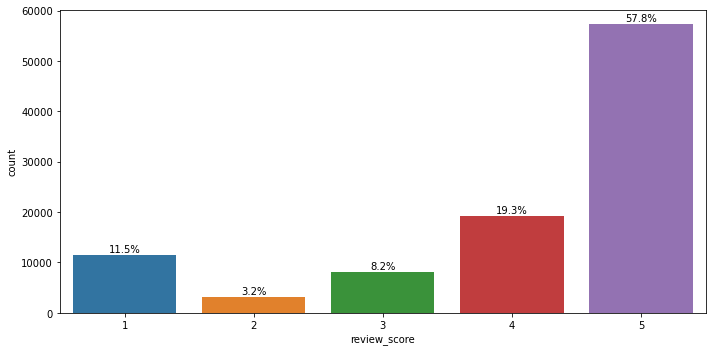

In [53]:
# Pourcentage des notes

plt.figure(figsize=(10, 5))
ax = sns.countplot(x='review_score',
                   data=df_order_reviews)
total = len(df_order_reviews)
for p in ax.patches:
    percentage = f'{100 * p.get_height() / total:.1f}%\n'
    x = p.get_x() + p.get_width() / 2
    y = p.get_height()
    ax.annotate(percentage, (x, y), ha='center', va='center')
plt.tight_layout()
plt.show()

Note allant de 1 à 5 donnée par le client dans une enquête de satisfaction. La majorité des commandes sont bien notées (4 ou 5).
Titre du commentaire et commentaires laissés par le client, en portugais.

In [54]:
# Suppression des variables inutiles pour notre étude

df_order_reviews1 = df_order_reviews.copy()
df_order_reviews1.drop(['review_comment_title',
                              'review_comment_message',
                              'review_creation_date',
                              'review_answer_timestamp'],
                             axis=1,inplace=True)

Jointure possible avec order_id et le jeu de données des commandes (df_reviews.order_id et df_orders.order_id).

#### Produits : df_translation

In [55]:
# 5 lignes

df_translation.sample(5)

,product_category_name,product_category_name_english
4,moveis_decoracao,furniture_decor
27,construcao_ferramentas_jardim,costruction_tools_garden
41,instrumentos_musicais,musical_instruments
46,artes,art
53,pcs,computers


In [56]:
# vérification du remplissage, des variables, des types de colonnes

df_translation.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 71 entries, 0 to 70
Data columns (total 2 columns):
 #   Column                         Non-Null Count  Dtype 
---  ------                         --------------  ----- 
 0   product_category_name          71 non-null     object
 1   product_category_name_english  71 non-null     object
dtypes: object(2)
memory usage: 1.2+ KB


Le dataframe sans valeurs absentes, contient la traduction des noms de la catégorie de produit en anglais.
Jointure possible avec product_category_name et le jeu de données des produits (df_translation.product_category_name et df_products.product_category_name).

#### Produits : df_products

In [57]:
# 5 lignes

df_products.sample(5)

,product_id,product_category_name,product_name_lenght,product_description_lenght,product_photos_qty,product_weight_g,product_length_cm,product_height_cm,product_width_cm
22894,79f9bb25cea215b868332aac0125c4f0,utilidades_domesticas,58.0,533.0,1.0,1100.0,27.0,24.0,27.0
4621,58f579bb52bea63fe1c6c39c2d4272d8,utilidades_domesticas,33.0,631.0,1.0,150.0,24.0,24.0,11.0
25481,55782ee5db5083e1e3bb2dbb054fdf49,cool_stuff,56.0,708.0,2.0,5400.0,42.0,21.0,36.0
6255,a3ccb9eeebc476c5a34811bedb6188b3,cool_stuff,22.0,165.0,1.0,423.0,24.0,13.0,16.0
24632,150c699262a053229e89213dc9c358d2,sinalizacao_e_seguranca,60.0,480.0,1.0,300.0,16.0,14.0,15.0


In [58]:
# vérification du remplissage, des variables, des types de colonnes

df_products.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 32951 entries, 0 to 32950
Data columns (total 9 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   product_id                  32951 non-null  object 
 1   product_category_name       32341 non-null  object 
 2   product_name_lenght         32341 non-null  float64
 3   product_description_lenght  32341 non-null  float64
 4   product_photos_qty          32341 non-null  float64
 5   product_weight_g            32949 non-null  float64
 6   product_length_cm           32949 non-null  float64
 7   product_height_cm           32949 non-null  float64
 8   product_width_cm            32949 non-null  float64
dtypes: float64(7), object(2)
memory usage: 2.3+ MB


Ce jeu de données regroupe des informations sur les catégories, poids, dimensions et descriptions des produits; il contient pas de valeurs absentes pour les commentaires.

In [59]:
# Fusion avec le jeu de données df_translation pour avoir des noms de catégories de produits en anglais

df_products1 =df_products.copy()
df_products1 = df_products1.merge(
    df_translation, on='product_category_name', how="left")

In [60]:
# Recherche des catégories non traduites en anglais

df_products1[df_products1['product_category_name_english']
            .isna() & df_products1['product_category_name']
            .notnull()][['product_category_name',
                         'product_category_name_english']]

,product_category_name,product_category_name_english
1628,pc_gamer,NaN
5821,portateis_cozinha_e_preparadores_de_alimentos,NaN
7325,portateis_cozinha_e_preparadores_de_alimentos,NaN
7478,pc_gamer,NaN
8819,portateis_cozinha_e_preparadores_de_alimentos,NaN
11039,portateis_cozinha_e_preparadores_de_alimentos,NaN
14266,portateis_cozinha_e_preparadores_de_alimentos,NaN
16182,portateis_cozinha_e_preparadores_de_alimentos,NaN
16930,pc_gamer,NaN
17800,portateis_cozinha_e_preparadores_de_alimentos,NaN


In [61]:
# Completer les valeurs manquantes de product_category_name_english

df_products1.loc[(df_products1['product_category_name'] == 'pc_gamer'),
                'product_category_name_english'] = 'pc_gamer'
df_products1.loc[(df_products1['product_category_name'] ==
                 'portateis_cozinha_e_preparadores_de_alimentos'),
                'product_category_name_english'] = \
                'kitchen_machines_and_food_processors'

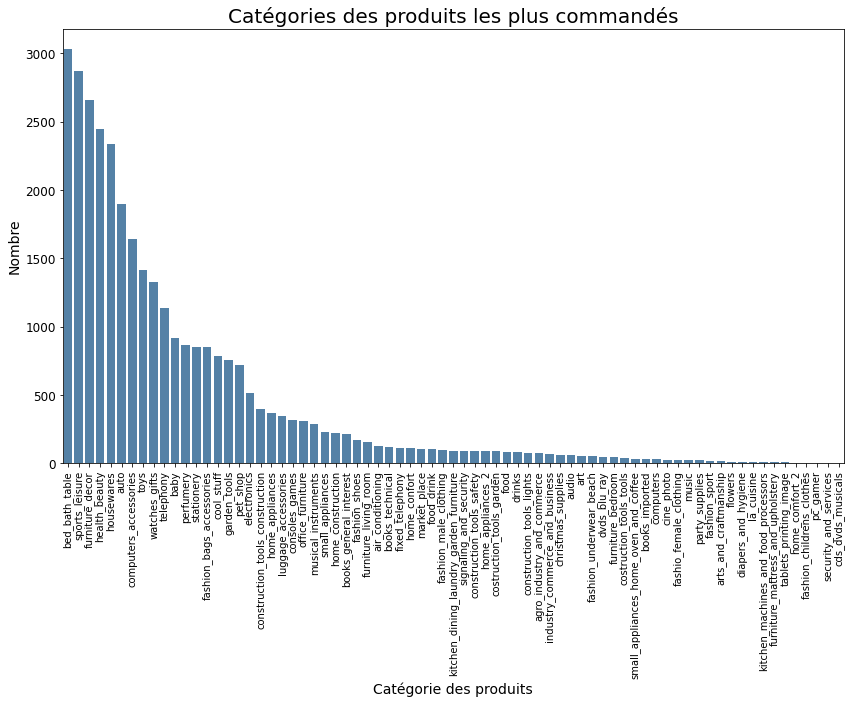

In [62]:
# Nombre de produits par catégorie

plt.figure(figsize=(14, 8))

sns.countplot(data=df_products1, x='product_category_name_english',
              order=df_products1.product_category_name_english
              .value_counts().index, color='SteelBlue')

plt.title('Catégories des produits les plus commandés', fontsize=20)
plt.ylabel('Nombre', fontsize=14)
plt.xlabel('Catégorie des produits', fontsize=14)

plt.xticks(rotation=90, fontsize=10)
plt.yticks(fontsize=12)
plt.grid(False)
plt.show()

In [63]:
df_products1['product_category_name_english'].nunique()

73

In [64]:
df_products1['product_category_name_english'].unique()

array(['perfumery', 'art', 'sports_leisure', 'baby', 'housewares',
       'musical_instruments', 'cool_stuff', 'furniture_decor',
       'home_appliances', 'toys', 'bed_bath_table',
       'construction_tools_safety', 'computers_accessories',
       'health_beauty', 'luggage_accessories', 'garden_tools',
       'office_furniture', 'auto', 'electronics', 'fashion_shoes',
       'telephony', 'stationery', 'fashion_bags_accessories', 'computers',
       'home_construction', 'watches_gifts',
       'construction_tools_construction', 'pet_shop', 'small_appliances',
       'agro_industry_and_commerce', nan, 'furniture_living_room',
       'signaling_and_security', 'air_conditioning', 'consoles_games',
       'books_general_interest', 'costruction_tools_tools',
       'fashion_underwear_beach', 'fashion_male_clothing',
       'kitchen_dining_laundry_garden_furniture',
       'industry_commerce_and_business', 'fixed_telephony',
       'construction_tools_lights', 'books_technical',
       'hom

Nombre de modalités de la varaible catégorie est grand, le regroupement est necessaire.
Jointures possibles avec product_id et le jeu de données des articles commandés (df_products.product_id et df_items.product_id).

In [65]:
# Regroupement des catégories : de 73 modalités à modalités
dico_categories = {

    # Food
    'drinks': 'food',
    'food': 'food',
    'food_drink': 'food',
    'la_cuisine': 'food',
    'kitchen_laptops_and_food_preparers': 'food',

    # Fashion
    'fashio_female_clothing': 'fashion',
    'fashion_bags_accessories': 'fashion',
    'fashion_childrens_clothes': 'fashion',
    'fashion_male_clothing': 'fashion',
    'fashion_shoes': 'fashion',
    'fashion_sport': 'fashion',
    'fashion_underwear_beach': 'fashion',
    'luggage_accessories': 'fashion',
    'watches_gifts': 'fashion',

    # Health_beauty
    'health_beauty': 'health_beauty',
    'perfumery': 'health_beauty',
    
    # Child
    'baby': 'child',
    'toys': 'child',
    'diapers_and_hygiene': 'child',

    # leisure
    'sports_leisure': 'leisure',
    'consoles_games': 'leisure',
    'musical_instruments': 'leisure',
    'cine_photo': 'leisure',
    'dvds_blu_ray': 'leisure',
    'cds_dvds_musicals': 'leisure',
    'music': 'leisure',
    'books_general_interest': 'leisure',
    'books_imported': 'leisure',
    'books_technical': 'leisure',

    # Home
    'furniture_bedroom': 'home',
    'furniture_decor': 'home',
    'furniture_living_room': 'home',
    'furniture_mattress_and_upholstery': 'home',
    'bed_bath_table': 'home',
    'christmas_supplies': 'home',
    'kitchen_dining_laundry_garden_furniture': 'home',
    'office_furniture': 'home',
    'home_appliances': 'home',
    'home_appliances_2': 'home',
    'home_comfort_2': 'home',
    'home_confort': 'home',
    'air_conditioning': 'home',
    'housewares': 'home',
    'art': 'home',
    'arts_and_craftmanship': 'home',
    'party_supplies': 'home',
    'flowers': 'home',
    'cool_stuff': 'home',

    # Construction
    'construction_tools_construction': 'construction',
    'construction_tools_lights': 'construction',
    'construction_tools_safety': 'construction',
    'costruction_tools_garden': 'construction',
    'costruction_tools_tools': 'construction',
    'garden_tools': 'construction',
    'home_construction': 'construction',

    # High technology
    'electronics': 'high_technology',
    'audio': 'high_technology',
    'tablets_printing_image': 'high_technology',
    'telephony': 'high_technology',
    'fixed_telephony': 'high_technology',
    'small_appliances': 'high_technology',
    'small_appliances_home_oven_and_coffee': 'high_technology',
    'computers_accessories': 'high_technology',
    'computers': 'high_technology',
    'security_and_services': 'high_technology',
    'signaling_and_security': 'high_technology',
    
    # Auto
    'auto': 'auto',

    # Other
    'stationery': 'other',
    'agro_industry_and_commerce': 'other',
    'industry_commerce_and_business': 'other',
    'market_place': 'other',
    'pet_shop': 'other',
    'other': 'other'
}

In [66]:
# Regroupement des modalités
df_products1['product_category_name_english'] = \
    df_products1['product_category_name_english'].map(dico_categories)

In [67]:
df_products1['product_category_name_english'].unique()

array(['health_beauty', 'home', 'leisure', 'child', 'construction',
       'high_technology', 'fashion', 'auto', 'other', nan, 'food'],
      dtype=object)

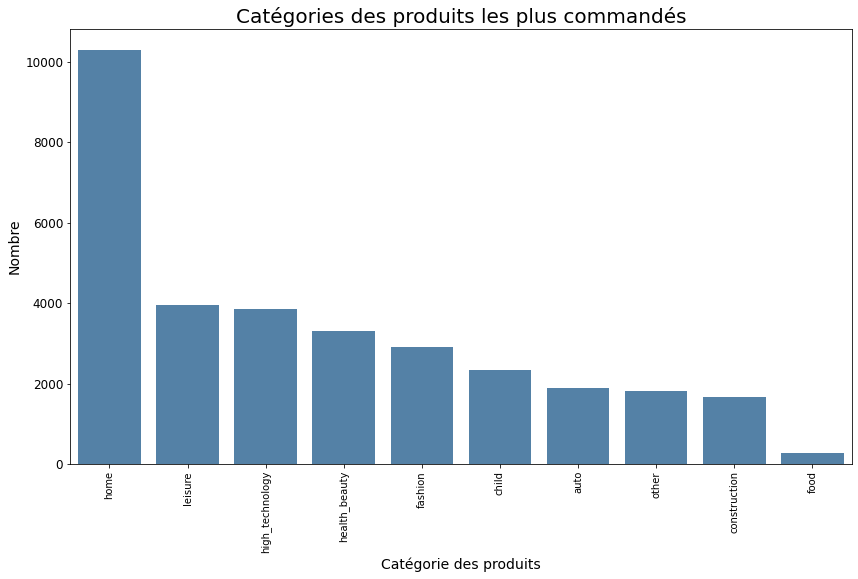

In [68]:
# Nombre de produits par catégorie

plt.figure(figsize=(14, 8))

sns.countplot(data=df_products1, x='product_category_name_english',
              order=df_products1.product_category_name_english
              .value_counts().index, color='SteelBlue')

plt.title('Catégories des produits les plus commandés', fontsize=20)
plt.ylabel('Nombre', fontsize=14)
plt.xlabel('Catégorie des produits', fontsize=14)

plt.xticks(rotation=90, fontsize=10)
plt.yticks(fontsize=12)
plt.grid(False)
plt.show()

In [69]:
# Suppression des variables inutiles pour notre étude (catégorie en portugais,
# les tailles des descriptions, la taille du produit)

df_products1 = df_products1.drop(['product_category_name',
                                'product_name_lenght',
                                'product_description_lenght',
                                'product_photos_qty',
                                'product_weight_g', 'product_length_cm',
                                'product_height_cm', 'product_width_cm'],
                               axis=1)

In [70]:
df_products1.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 32951 entries, 0 to 32950
Data columns (total 2 columns):
 #   Column                         Non-Null Count  Dtype 
---  ------                         --------------  ----- 
 0   product_id                     32951 non-null  object
 1   product_category_name_english  32328 non-null  object
dtypes: object(2)
memory usage: 1.8+ MB


#### Vendeurs : df_sellers

In [71]:
# 5 lignes

df_sellers.sample(5)

,seller_id,seller_zip_code_prefix,seller_city,seller_state
1526,8931a84a914b3fe9b1ddaa4d704947ca,8410,sao paulo,SP
2221,8fb791022c1fc8909664f48ab7dc636d,3976,sao paulo,SP
2754,3b872fd4747f01cc56206f2934198618,14940,ibitinga,SP
208,b4a476fbd28de64b1e347abf9089366a,6653,itapevi,SP
785,6902157ee16728322d61a1321fa79e58,1026,sao paulo,SP


In [72]:
# vérification du remplissage, des variables, des types de colonnes

df_sellers.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3095 entries, 0 to 3094
Data columns (total 4 columns):
 #   Column                  Non-Null Count  Dtype 
---  ------                  --------------  ----- 
 0   seller_id               3095 non-null   object
 1   seller_zip_code_prefix  3095 non-null   int64 
 2   seller_city             3095 non-null   object
 3   seller_state            3095 non-null   object
dtypes: int64(1), object(3)
memory usage: 96.8+ KB


Jeu de données des emplacements des vendeurs. Pas de valeurs manquantes. Jointure possible avec le jeu de données des articles commandés et le jeu de données de géolocalisation.

## Merge

In [73]:
# Fusion des jeux de données : df_customers et df_orders1 (commandes livrés uniquement)
# Variable de jointure : customer_id

df1 = pd.merge(df_customers, df_orders1, on='customer_id', how='inner')
df1.shape

(96455, 11)

In [74]:
# Fusion des jeux de données : df1 et df_geolocation1
# Variables de jointure : df1.customer_zip_code_prefix
#                      et df_geolocation1.geolocation_zip_code_prefix
df2 = pd.merge(df1, df_geolocation1, left_on='customer_zip_code_prefix',
               right_on='geolocation_zip_code_prefix', how='left')
df2.shape

(96455, 14)

In [75]:
# Fusion des jeux de données : df2 et df_reviews
df3 = pd.merge(df2, df_order_reviews1, on='order_id', how='left')
df3.shape

(96984, 16)

In [76]:
# Fusion des jeux de données : df3 et df_items1 (ajout aux commandes les informations 
# sur les articles commandés, dèjà regroupés une ligne par commande)

df4 = pd.merge(df3, df_order_items, on='order_id', how='left')
df4.shape

(110816, 22)

In [77]:
# Fusion des jeux de données : df4 et df_payments (ajout aux commandes les informations 
# sur les paiements)

df5 = pd.merge(df4, df_order_payments, on='order_id', how='left')
df5.shape

(115699, 26)

In [78]:
# Fusion des jeux de données : df5 et df_products (ajout aux commandes les informations sur les catégories de produit)
df6 = pd.merge(df5, df_products1, on='product_id', how='left')
df6.shape

(115699, 27)

## Analyse

In [79]:
df6.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 115699 entries, 0 to 115698
Data columns (total 27 columns):
 #   Column                         Non-Null Count   Dtype         
---  ------                         --------------   -----         
 0   customer_id                    115699 non-null  object        
 1   customer_unique_id             115699 non-null  object        
 2   customer_zip_code_prefix       115699 non-null  int64         
 3   customer_city                  115699 non-null  object        
 4   customer_state                 115699 non-null  object        
 5   order_id                       115699 non-null  object        
 6   order_purchase_timestamp       115699 non-null  datetime64[ns]
 7   order_delivered_customer_date  115699 non-null  datetime64[ns]
 8   order_estimated_delivery_date  115699 non-null  datetime64[ns]
 9   delivery_days                  115699 non-null  int64         
 10  delivery_late                  115699 non-null  int64         
 11  

<AxesSubplot:>

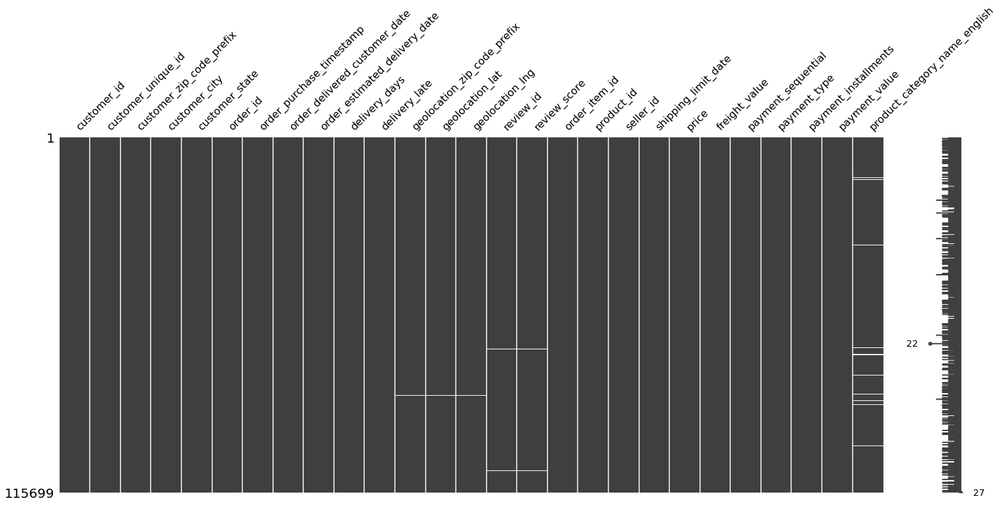

In [80]:
# visualiser le remplissage des variables

msno.matrix(df6)

In [81]:
# Suppression des valeurs manquantes

df6 = df6.dropna()
df6.shape

(112890, 27)

In [82]:
df6.nunique()

customer_id                      94208
customer_unique_id               91212
customer_zip_code_prefix         14678
customer_city                     4028
customer_state                      27
order_id                         94208
order_purchase_timestamp         93715
order_delivered_customer_date    93428
order_estimated_delivery_date      444
delivery_days                      143
delivery_late                        2
geolocation_zip_code_prefix      14678
geolocation_lat                  14678
geolocation_lng                  14678
review_id                        94032
review_score                         5
order_item_id                       21
product_id                       31432
seller_id                         2907
shipping_limit_date              89302
price                             5764
freight_value                     6874
payment_sequential                  26
payment_type                         4
payment_installments                24
payment_value            

#### Ajout des varaibles RFM

La segmentation RFM repose sur ces 3 critères :
Récence : date du dernier achat ou dernier contact client,
Fréquence : fréquence des achats sur une période de référence donnée,
Montant : somme des achats cumulés sur cette période (ou somme moyenne).

In [83]:
# Creation snapshot date

snapshot_date = df6['order_purchase_timestamp'].max() + timedelta(days=1)
print(snapshot_date)

2018-08-30 15:00:37


In [84]:
df6.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 112890 entries, 0 to 115698
Data columns (total 27 columns):
 #   Column                         Non-Null Count   Dtype         
---  ------                         --------------   -----         
 0   customer_id                    112890 non-null  object        
 1   customer_unique_id             112890 non-null  object        
 2   customer_zip_code_prefix       112890 non-null  int64         
 3   customer_city                  112890 non-null  object        
 4   customer_state                 112890 non-null  object        
 5   order_id                       112890 non-null  object        
 6   order_purchase_timestamp       112890 non-null  datetime64[ns]
 7   order_delivered_customer_date  112890 non-null  datetime64[ns]
 8   order_estimated_delivery_date  112890 non-null  datetime64[ns]
 9   delivery_days                  112890 non-null  int64         
 10  delivery_late                  112890 non-null  int64         
 11  

In [85]:
df6['delivery_late'] = df6['delivery_late'].astype('bool')

In [86]:
# Regroupement par client et création des nouvelles variables

df = df6.groupby(['customer_unique_id']).apply(lambda x: pd.Series({
    'last_purchase_date': x['order_purchase_timestamp'].max(),
    'recency': (snapshot_date - x['order_purchase_timestamp'].max()).days,
    'frequency': x['order_id'].nunique(),
    'mean_price': x['payment_value'].mean(),
    'sum_price': x['payment_value'].sum(),
    'geolocation_lat': x['geolocation_lat'].mean(),
    'geolocation_lng': x['geolocation_lng'].mean(),
    'mean_delivery_days': x['delivery_days'].mean(),
    'mean_delivery_late': x['delivery_late'].max(),
    'avg_review_score': x['review_score'].mean(),
    'mean_n_item':x['order_item_id'].mean(),
    'main_product_category': stats.mode(x['product_category_name_english'])[0].item(),
    'main_payment_type': stats.mode(x['payment_type'])[0].item(),
    'mean_payment_installments': x['payment_installments'].mean(),
    'customer_city': stats.mode(x['customer_city'])[0].item()
}))

In [89]:
# Création du dataframe des clients qui ont commandé deux fois ou plus

df_client = df[df['frequency'] > 1]

In [90]:
df_client.head(5)

,last_purchase_date,recency,frequency,mean_price,sum_price,geolocation_lat,geolocation_lng,mean_delivery_days,mean_delivery_late,avg_review_score,mean_n_item,main_product_category,main_payment_type,mean_payment_installments,customer_city
customer_unique_id,,,,,,,,,,,,,,,
004288347e5e88a27ded2bb23747066c,2018-01-14 07:36:54,228,2,177.185000,354.37,-22.758406,-43.442958,6.500000,False,5.000000,1.000000,fashion,credit_card,2.000000,nova iguacu
00cc12a6d8b578b8ebd21ea4e2ae8b27,2017-03-21 19:25:23,526,2,63.100000,252.40,-23.553470,-46.587790,5.500000,False,4.000000,1.000000,home,boleto,1.000000,sao paulo
011575986092c30523ecb71ff10cb473,2018-04-18 21:58:08,133,2,107.450000,214.90,-19.985952,-44.024958,13.000000,False,3.500000,1.000000,child,credit_card,1.500000,belo horizonte
011b4adcd54683b480c4d841250a987f,2018-02-15 11:40:57,196,2,128.726667,386.18,-12.550877,-38.706479,12.333333,False,4.333333,1.333333,food,credit_card,8.000000,santo amaro
012452d40dafae4df401bced74cdb490,2018-05-14 12:12:45,108,2,165.110000,495.33,-23.605330,-46.523077,6.666667,False,4.666667,1.000000,health_beauty,credit_card,5.333333,sao paulo


In [91]:
df_client_full = df.copy()
df_client_full = df_client_full.reset_index()

In [92]:
df_client_full.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 91212 entries, 0 to 91211
Data columns (total 16 columns):
 #   Column                     Non-Null Count  Dtype         
---  ------                     --------------  -----         
 0   customer_unique_id         91212 non-null  object        
 1   last_purchase_date         91212 non-null  datetime64[ns]
 2   recency                    91212 non-null  int64         
 3   frequency                  91212 non-null  int64         
 4   mean_price                 91212 non-null  float64       
 5   sum_price                  91212 non-null  float64       
 6   geolocation_lat            91212 non-null  float64       
 7   geolocation_lng            91212 non-null  float64       
 8   mean_delivery_days         91212 non-null  float64       
 9   mean_delivery_late         91212 non-null  bool          
 10  avg_review_score           91212 non-null  float64       
 11  mean_n_item                91212 non-null  float64       
 12  main

In [93]:
df_client_full.describe()

,recency,frequency,mean_price,sum_price,geolocation_lat,geolocation_lng,mean_delivery_days,avg_review_score,mean_n_item,mean_payment_installments
count,91212.000000,91212.000000,91212.000000,91212.000000,91212.000000,91212.000000,91212.000000,91212.000000,91212.000000,91212.000000
mean,237.109415,1.032847,157.716251,212.352124,-21.192138,-46.189407,12.048118,4.154497,1.070734,2.903366
std,152.573347,0.206185,215.772024,631.928631,5.612169,4.057529,9.455992,1.279310,0.266138,2.680293
min,1.000000,1.000000,1.856818,9.590000,-33.689948,-72.668881,0.000000,1.000000,1.000000,0.000000
25%,114.000000,1.000000,60.750000,63.830000,-23.590229,-48.124815,6.000000,4.000000,1.000000,1.000000
50%,218.000000,1.000000,103.488333,112.880000,-22.924015,-46.632937,10.000000,5.000000,1.000000,2.000000
75%,345.000000,1.000000,174.962500,202.760000,-20.138476,-43.629330,15.000000,5.000000,1.000000,4.000000
max,695.000000,14.000000,13664.080000,109312.640000,42.184003,-8.723762,208.000000,5.000000,11.000000,24.000000


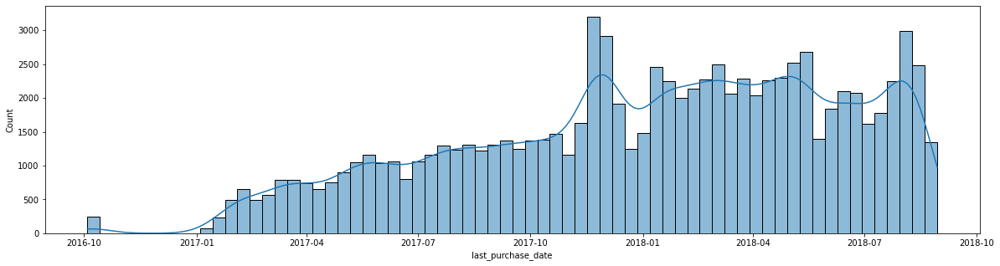

In [94]:
# Histogramme: date de dernier achat

plt.figure(figsize=(20, 5))
sns.histplot(x=df_client_full['last_purchase_date'],
             data=df_client_full,
             kde=True)
plt.show()

In [95]:
# Distribution des varaibles quantitatives

def var_num_distribution(data):
    df_num = data.select_dtypes(exclude=['object', 'datetime64[ns]','bool']).columns

    for col in df_num:
        fig = plt.figure(figsize=(20, 5))

        plt.subplot(1, 2, 1)
        sns.histplot(x=data[col],
                     data=data,
                     kde=True)

        plt.subplot(1, 2, 2)
        sns.boxplot(x=data[col],
                    data=data)
        fig.tight_layout(pad=0.8)

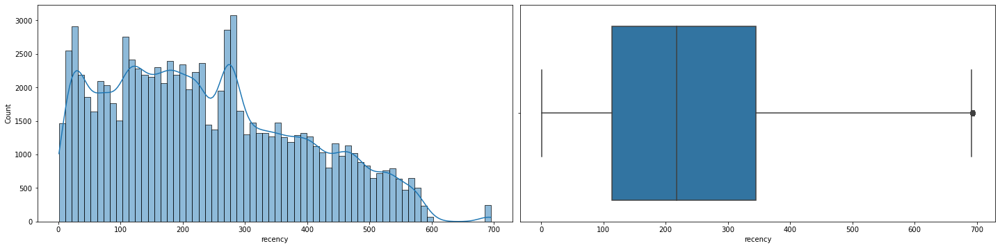

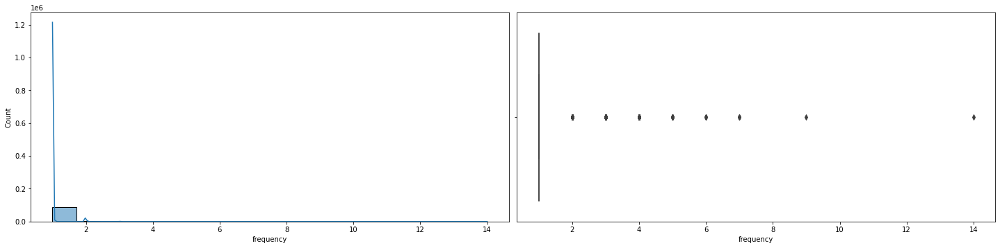

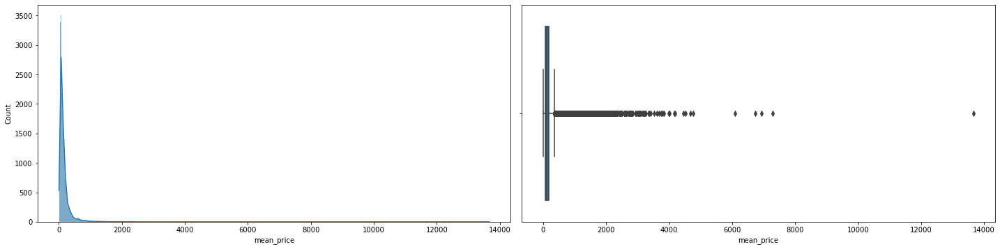

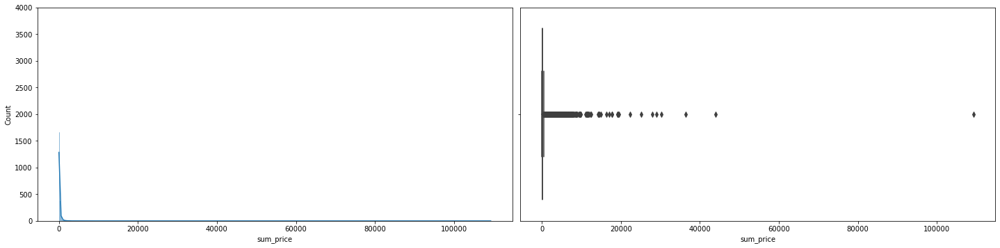

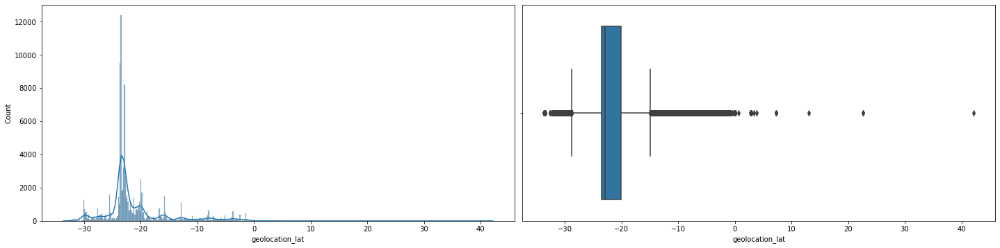

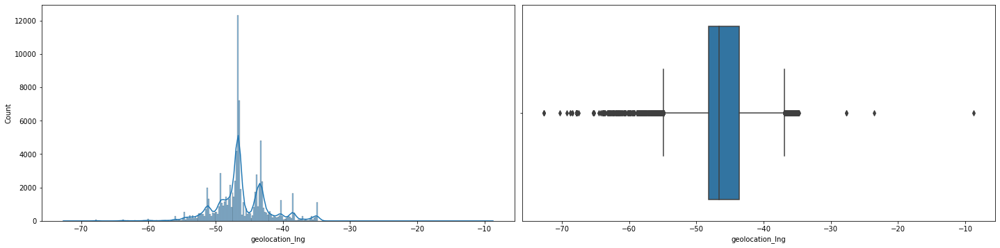

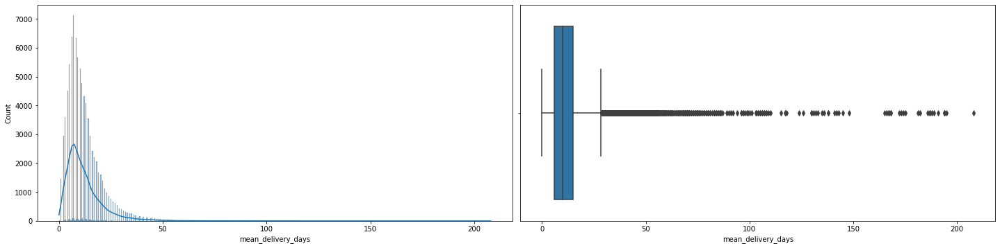

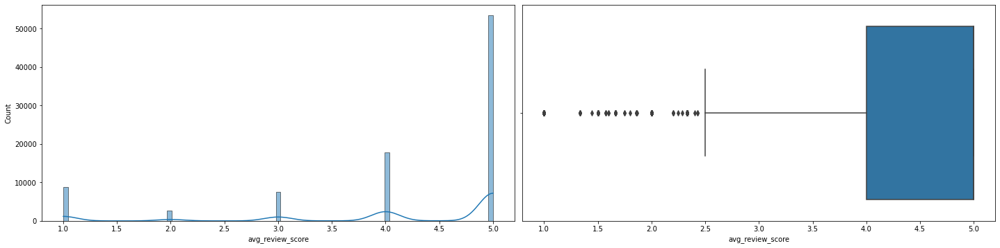

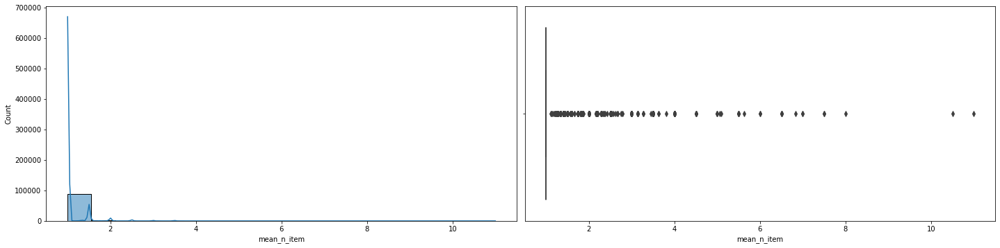

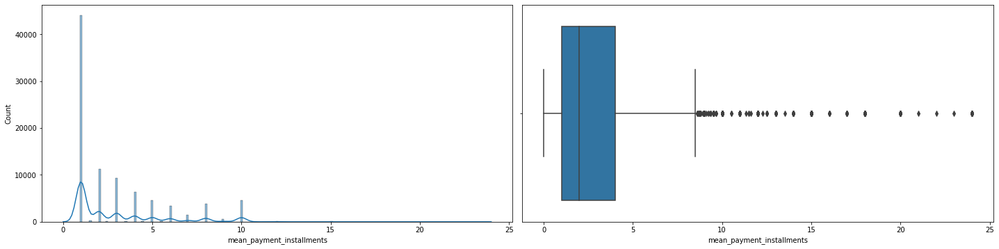

In [96]:
var_num_distribution(df_client_full)

In [98]:
# Zoom sur outlier

df_client_full.loc[df_client_full['sum_price']>100000,:]

,customer_unique_id,last_purchase_date,recency,frequency,mean_price,sum_price,geolocation_lat,geolocation_lng,mean_delivery_days,mean_delivery_late,avg_review_score,mean_n_item,main_product_category,main_payment_type,mean_payment_installments,customer_city
3641,0a0a92112bd4c708ca5fde585afaa872,2017-09-29 15:24:52,334,1,13664.08,109312.64,-22.901209,-43.184957,18.0,False,1.0,4.5,high_technology,credit_card,1.0,rio de janeiro


In [100]:
# Supprimer outlier, client à traiter individuellement

index = df_client_full.loc[df_client_full['sum_price']>100000,:].index
df_client_full = df_client_full.drop(index)

In [102]:
df_client_full.describe()

,recency,frequency,mean_price,sum_price,geolocation_lat,geolocation_lng,mean_delivery_days,avg_review_score,mean_n_item,mean_payment_installments
count,91211.000000,91211.000000,91211.000000,91211.000000,91211.000000,91211.000000,91211.000000,91211.000000,91211.000000,91211.000000
mean,237.108353,1.032847,157.568173,211.155994,-21.192120,-46.189440,12.048052,4.154532,1.070697,2.903387
std,152.573846,0.206186,211.087742,518.495029,5.612197,4.057539,9.456024,1.279275,0.265898,2.680300
min,1.000000,1.000000,1.856818,9.590000,-33.689948,-72.668881,0.000000,1.000000,1.000000,0.000000
25%,114.000000,1.000000,60.750000,63.830000,-23.590247,-48.124815,6.000000,4.000000,1.000000,1.000000
50%,218.000000,1.000000,103.486667,112.880000,-22.924015,-46.632948,10.000000,5.000000,1.000000,2.000000
75%,345.000000,1.000000,174.960000,202.760000,-20.138476,-43.629330,15.000000,5.000000,1.000000,4.000000
max,695.000000,14.000000,7274.880000,44048.000000,42.184003,-8.723762,208.000000,5.000000,11.000000,24.000000


In [103]:
var_num = df_client_full.select_dtypes(exclude=['object', 'datetime64[ns]','bool']).columns

# test de normalité de distribution des variables numériques

for column in var_num:
    print('________\n{}'.format(column))
    D, p = stats.kstest(df_client_full[column].dropna(), 
                     'norm', 
                     args=(df_client_full[column].mean(), df_client_full[column].std()))
    alpha = 5e-2
    print("p = {}".format(p))
    if p < alpha:  # null hypothesis: x comes from a normal distribution
        print("HO est rejetée : {} n'est pas distribuée normalement".format(column))
    else:
        print("HO n'est pas rejetée")

________
recency
p = 3.672716826570815e-302
HO est rejetée : recency n'est pas distribuée normalement
________
frequency
p = 0.0
HO est rejetée : frequency n'est pas distribuée normalement
________
mean_price
p = 0.0
HO est rejetée : mean_price n'est pas distribuée normalement
________
sum_price
p = 0.0
HO est rejetée : sum_price n'est pas distribuée normalement
________
geolocation_lat
p = 0.0
HO est rejetée : geolocation_lat n'est pas distribuée normalement
________
geolocation_lng
p = 0.0
HO est rejetée : geolocation_lng n'est pas distribuée normalement
________
mean_delivery_days
p = 0.0
HO est rejetée : mean_delivery_days n'est pas distribuée normalement
________
avg_review_score
p = 0.0
HO est rejetée : avg_review_score n'est pas distribuée normalement
________
mean_n_item
p = 0.0
HO est rejetée : mean_n_item n'est pas distribuée normalement
________
mean_payment_installments
p = 0.0
HO est rejetée : mean_payment_installments n'est pas distribuée normalement


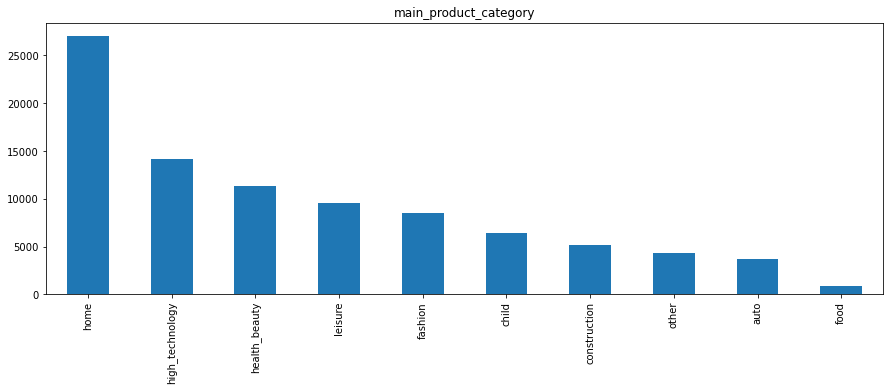

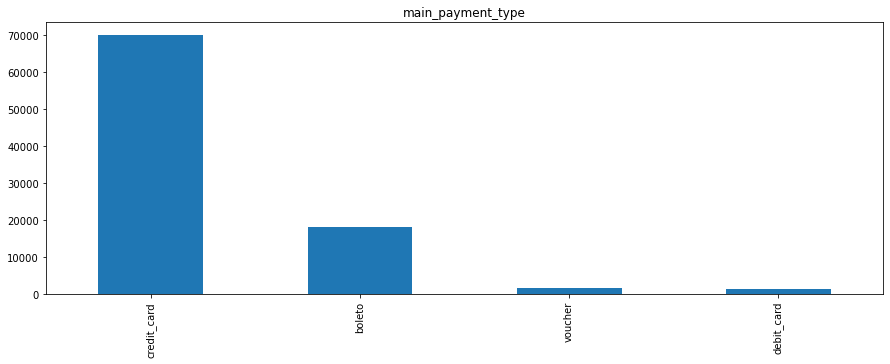

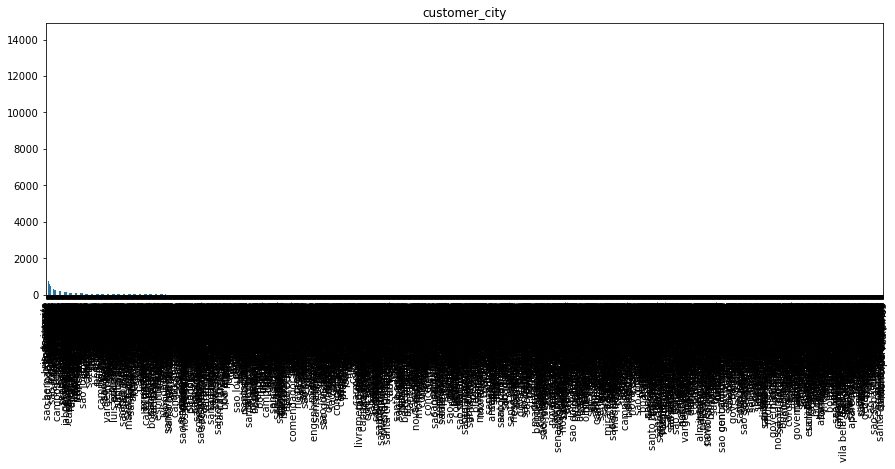

In [104]:
# Variables catégorielles
df_cat = df_client_full.select_dtypes('object','bool')
del df_cat['customer_unique_id']
var_cat = df_cat.select_dtypes('object','bool').columns

for var in var_cat:
    plt.figure(figsize=(15, 5))
    df_client_full.loc[:, var].value_counts().plot.bar()
    plt.title(var)
    fig.tight_layout(pad=0.8)

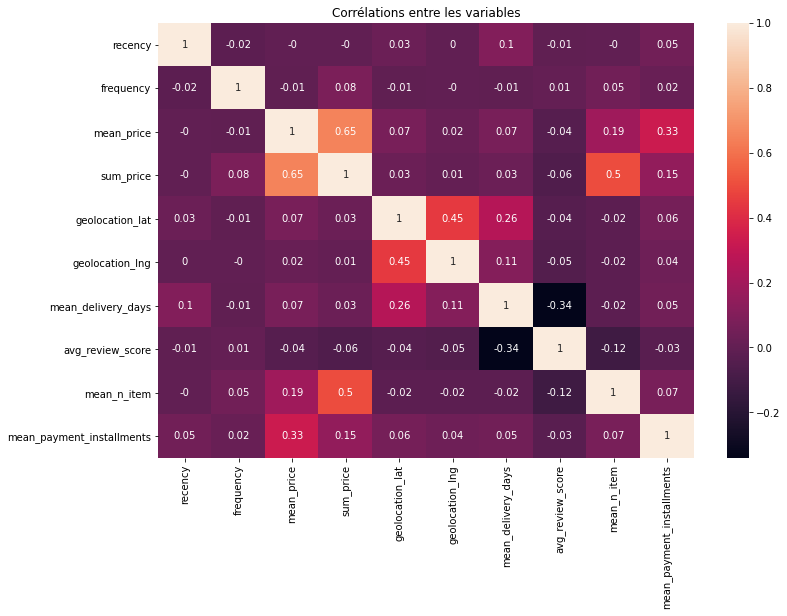

In [314]:
# corrélation des variables (heatmap)

corr = df_client_full[var_num].corr(method='pearson')
corr = corr.round(decimals=2)
plt.figure(figsize=(12, 8))
sns.heatmap(corr, annot=True)
plt.title("Corrélations entre les variables", color= 'black')
plt.show()

In [105]:
var_cat = ['main_product_category', 'main_payment_type', 'mean_delivery_late']

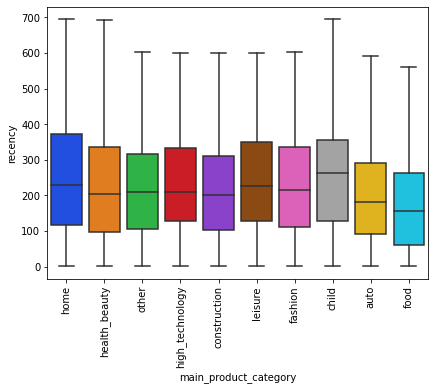

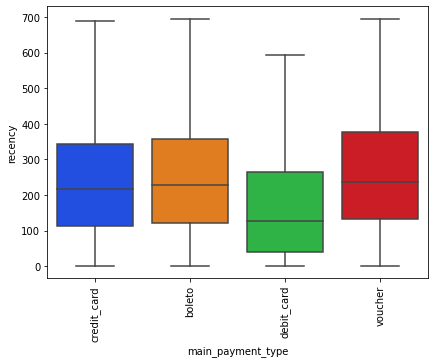

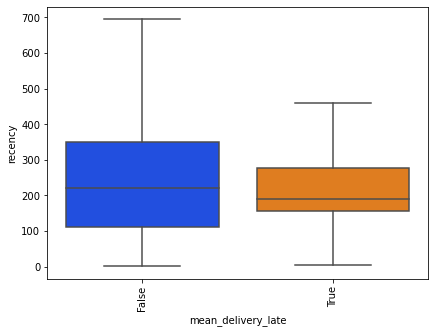

In [106]:
# Relations entre les variables catégorielles et les variables RFM (boxplot)

for col in df_client_full.loc[:, var_cat]:
    fig = plt.figure(figsize=(15, 5))

    plt.subplot(1, 2, 1)
    ax = sns.boxplot(y='recency',
                         x=col,
                         palette='bright',
                         data=df_client_full,
                         showfliers=False)
    plt.xticks(rotation=90)

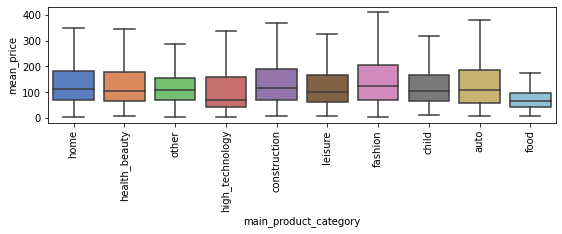

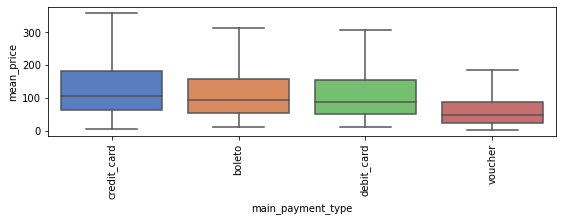

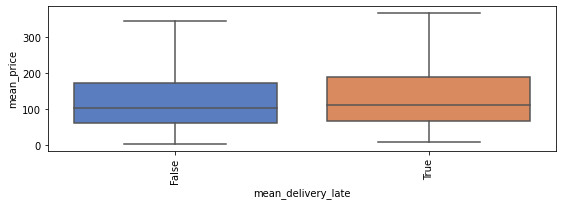

In [108]:
for col in df_client_full.loc[:, var_cat]:
    fig = plt.figure(figsize=(15, 5))
    plt.subplot(2, 2, 3)
    ax = sns.boxplot(y='mean_price',
                         x=col,
                         palette='muted',
                         data=df_client_full,
                         showfliers=False)
    plt.xticks(rotation=90)
    fig.tight_layout(pad=0.8)

In [109]:
# ANOVA variables catégorielles / recency

import statsmodels.api as sm
from statsmodels.formula.api import ols
  
for col in var_cat:
    model = ols(f'recency~C({col})', data=df_client_full).fit()
    aov_table = sm.stats.anova_lm(model, typ=2)
    print(f' {col}')
    display(aov_table)
    print('\n')

 main_product_category


,sum_sq,df,F,PR(>F)
C(main_product_category),1.518580e+07,9.0,72.997757,3.854944e-135
Residual,2.108072e+09,91201.0,NaN,NaN




 main_payment_type


,sum_sq,df,F,PR(>F)
C(main_payment_type),8.939519e+06,3.0,128.543694,4.295758e-83
Residual,2.114318e+09,91207.0,NaN,NaN




 mean_delivery_late


,sum_sq,df,F,PR(>F)
C(mean_delivery_late),2.220751e+06,1.0,95.49692,1.519472e-22
Residual,2.121037e+09,91209.0,NaN,NaN


In [110]:
# ANOVA variables catégorielles / frequency

import statsmodels.api as sm
from statsmodels.formula.api import ols
  
for col in var_cat:
    model = ols(f'frequency~C({col})', data=df_client_full).fit()
    aov_table = sm.stats.anova_lm(model, typ=2)
    print(f' {col}')
    display(aov_table)
    print('\n')

 main_product_category


,sum_sq,df,F,PR(>F)
C(main_product_category),4.700404,9.0,12.29864,1.096962e-19
Residual,3872.890238,91201.0,NaN,NaN




 main_payment_type


,sum_sq,df,F,PR(>F)
C(main_payment_type),0.933823,3.0,7.323419,0.000066
Residual,3876.656819,91207.0,NaN,NaN




 mean_delivery_late


,sum_sq,df,F,PR(>F)
C(mean_delivery_late),2.758311,1.0,64.927404,7.863928e-16
Residual,3874.832330,91209.0,NaN,NaN


In [111]:
# ANOVA variables catégorielles / mean_price

import statsmodels.api as sm
from statsmodels.formula.api import ols
  
for col in var_cat:
    model = ols(f'mean_price~C({col})', data=df_client_full).fit()
    aov_table = sm.stats.anova_lm(model, typ=2)
    print(f' {col}')
    display(aov_table)
    print('\n')

 main_product_category


,sum_sq,df,F,PR(>F)
C(main_product_category),1.786931e+07,9.0,44.751749,5.400982e-81
Residual,4.046269e+09,91201.0,NaN,NaN




 main_payment_type


,sum_sq,df,F,PR(>F)
C(main_payment_type),1.851108e+07,3.0,139.108211,6.280940e-90
Residual,4.045627e+09,91207.0,NaN,NaN




 mean_delivery_late


,sum_sq,df,F,PR(>F)
C(mean_delivery_late),1.540216e+06,1.0,34.579251,4.106654e-09
Residual,4.062598e+09,91209.0,NaN,NaN


In [113]:
# Exportation de jeu de données après feature engineering

df_client_full.to_csv("df_client_full_model.csv",header=True,index=False)

In [114]:
# Exportation de jeu de données après feature engineering

df_client.to_csv("df_client_model.csv",header=True,index=False)